# Evaluating Denoising Efficiency

## Introduction 

Simulated using MIRT as described in [Nelson et al., 2023](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.16901) where the acquisition parameters are meant to simulate the Siemens Somatom Definition AS+, which is one of the scanners used in developing the [Low Dose CT Grand Challenge Dataset](https://aapm.onlinelibrary.wiley.com/doi/full/10.1002/mp.12345). However I still need to be careful that this is an approximation and there still may be mismatch between the real and simulated scans, though [Zeng et al., 2022](http://onlinelibrary.wiley.com/doi/abs/10.1002/mp.15430) validated the simulations with physical scans based on MTF and NPS performance measures.

**Question**: Data augmentation is a common approach for dealing with limited datasets. Can data augmentation techniques be used to make up for limited pediatric data?

**Hypothesis**: Noise textures from pediatric-sized phantom scans can be used as an effective data augmentation to improve denoising model generalizability to pediatric patients.

*Purpose* to test our hypothesis that training with noise augmentation can improve performance in pediatric patients. This notebook presents the results in terms of denoising efficiency, which we define in two ways depending on the data available.

If we assume noise as additive ([double check this assumption](https://numpy.org/doc/stable/reference/random/generated/numpy.random.Generator.poisson.html#numpy.random.Generator.poisson)) then we can say the measured signal is $y=Ax + n$, where $x$ is the map of x-ray attenuation coefficients in the cross-section and $y$ is the measured x-ray projections with added blurring and artifacts from the system matrix $A$ and noise $n$. Image reconstruction then takes the form of $x' = A^{-1}(y - n) ~ A^{-1}y - A^{-1}n$ Thus the idea of image-based denoising assumes that the noise in the CT image is seperable and can be estimated and subtracted  

## Methods: Measures of Noise Reduction
To evaluate the estimation of x' we can define RMSE as a measure of how well we've estimated and thus removed noise from the image.

$$
RMSE(x, x') = \sqrt{\bar{(x' - x)^2}}
$$

Key to RMSE is assumed knowledge of the ground truth image $x$, which we have access to in simulations. However when we using patient images we don't have access to ground truth, at best we have a low dose and routine dose pair to compare a against to get MSE.

If even that doesn't exist you can select a region that is assumed to be uniform and compare measured standard deviation in the region:

$$
noise std = \sqrt{\bar{x-\bar{x}}}
$$

here we assume a uniform region such that that $\bar{x}$ is assumed to be the true value for an unbiased measurement in a uniform region

We can thus define noise reduction both in terms of noise std and RMSE as:

$$
Noise Reduction = 100\% \times \frac{(FBP - denoised)}{FBP}
$$

Defining noise reduction relative to the original FBP noise level

## Outline
- [Noise Reduction in Uniform Phantoms](#Noise-Reduction-in-Uniform-Phantoms)
- [Noise Reduction in Anthropomorphic Phantoms](#Noise-Reduction-in-Anthropomorphic-Phantoms)
- [Putting it all together: denoising trends with phantom size](#Putting-it-all-together:-plotting-trends)
- [Conclusions](#Conclusions)

Focus is on noise magnitude reduction in uniform phantoms and low dose patient images and RMSE reduction in uniform and anthropomorphic phantoms since ground truth is known.

## Noise Reduction in Uniform Phantoms

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import SimpleITK as sitk

import sys
sys.path.append('..')

from utils import circle_select, get_circle_diameter, load_mhd, ctshow, make_montage, add_random_circle_lesion, get_ground_truth

base_dir = Path('/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation')
phantom_dir = base_dir / 'CCT189_peds'
anthro_dir = base_dir / 'anthropomorphic'

In [2]:
phantom_meta = pd.read_csv(phantom_dir / 'metadata.csv')
phantom_meta.file = phantom_meta.file.apply(lambda o: str(phantom_dir / o))
phantom_meta

,Name,effective diameter (cm),Dose [%],recon,phantom,file
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
1,35.0 cm MITA-LCD,35.0,10,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
2,35.0 cm MITA-LCD,35.0,10,fbp,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
3,35.0 cm MITA-LCD,35.0,40,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
4,35.0 cm MITA-LCD,35.0,40,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
...,...,...,...,...,...,...
373,15.1 cm uniform,15.1,70,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
374,15.1 cm uniform,15.1,70,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
375,15.1 cm uniform,15.1,85,RED-CNN augmented,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
376,15.1 cm uniform,15.1,85,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...


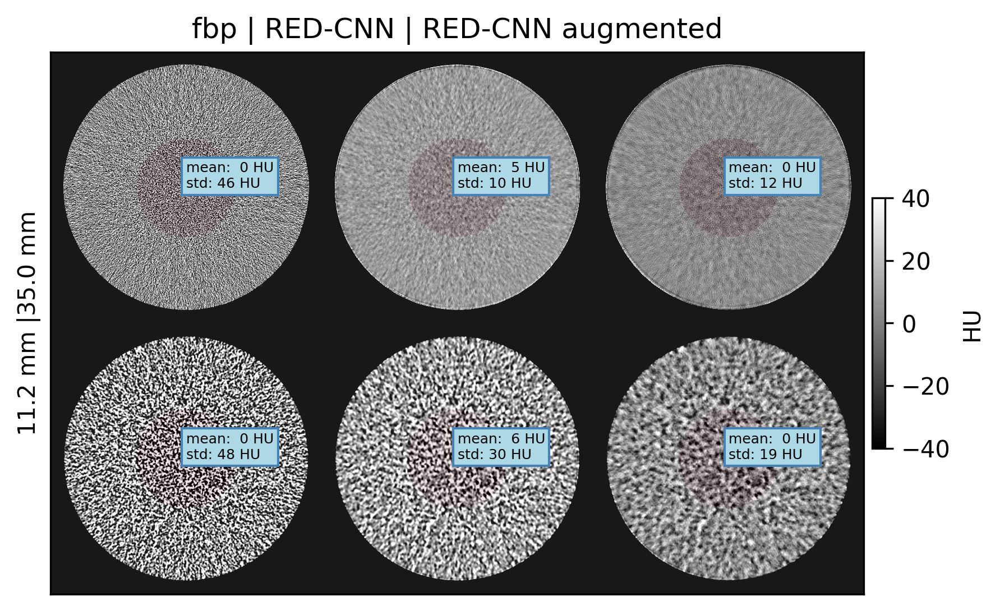

In [3]:
plt.figure(dpi=300)
make_montage(phantom_meta, phantom='uniform', roi_diameter=0.4)

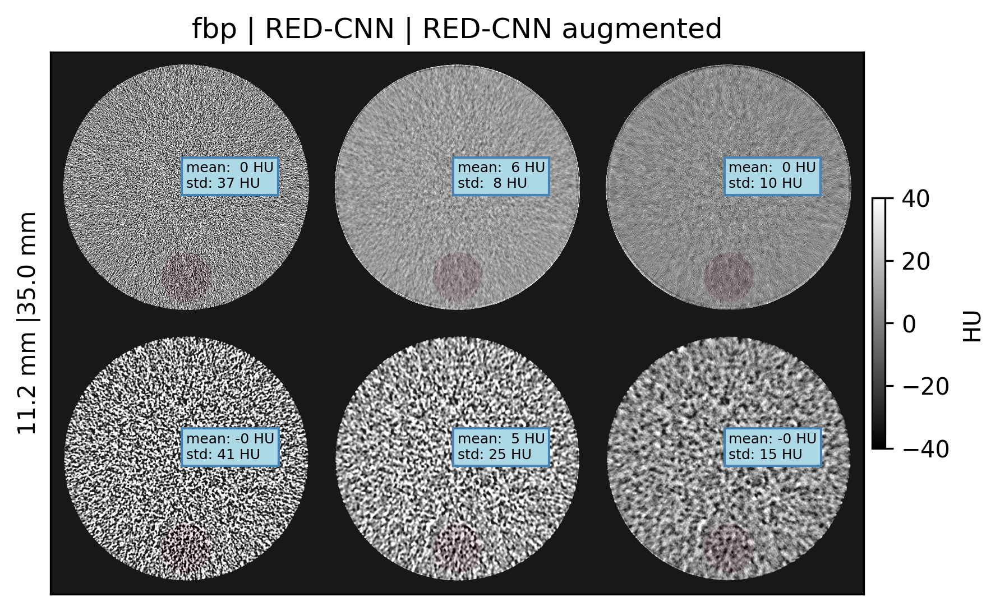

In [4]:
plt.figure(dpi=300)
make_montage(phantom_meta, phantom='uniform', roi_diameter=0.2, roi_center=(425, 256))

### Noise std Reduction in Uniform Phantoms

In [5]:
fbp_qd_350 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'fbp') &
                                                 (phantom_meta['effective diameter (cm)'] == 35.0) &
                                                 (phantom_meta['Dose [%]'] == 25) &
                                                 (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 1000

fbp_qd_112 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'fbp') &
                                                 (phantom_meta['effective diameter (cm)'] == 11.2) &
                                                 (phantom_meta['Dose [%]'] == 25) &
                                                 (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 1000

red_qd_350 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'RED-CNN') &
                                                 (phantom_meta['effective diameter (cm)'] == 35.0) &
                                                 (phantom_meta['Dose [%]'] == 25) &
                                                 (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

red_qd_112 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'RED-CNN') &
                                                 (phantom_meta['effective diameter (cm)'] == 11.2) &
                                                 (phantom_meta['Dose [%]'] == 25) &
                                                 (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

redaug_qd_350 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'RED-CNN augmented') &
                                                    (phantom_meta['effective diameter (cm)'] == 35.0) &
                                                    (phantom_meta['Dose [%]'] == 25) &
                                                    (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

redaug_qd_112 = load_mhd(phantom_dir / phantom_meta[(phantom_meta.recon == 'RED-CNN augmented') &
                                                    (phantom_meta['effective diameter (cm)'] == 11.2) &
                                                    (phantom_meta['Dose [%]'] == 25) &
                                                    (phantom_meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

phantom_diameter_px = get_circle_diameter(fbp_qd_350)
circle_selection_diameter_px = 0.4*phantom_diameter_px # iec standard suggests centred circle ROI 40% of phantom diameter 
circle_selection = circle_select(fbp_qd_350, xy=(256, 256), r = circle_selection_diameter_px/2)

In [6]:
from utils import noise_reduction

print(f'Large diameter denoising efficiency [RED-CNN]: %{noise_reduction(fbp_qd_350[circle_selection].std(), red_qd_350[circle_selection].std()):2.2f}')
print(f'Small diameter denoising efficiency [RED-CNN]: %{noise_reduction(fbp_qd_112[circle_selection].std(), red_qd_112[circle_selection].std()):2.2f}')
print('---------------------------------------------------------------')
print(f'Large diameter denoising efficiency [RED-CNN Augmented]: %{noise_reduction(fbp_qd_350[circle_selection].std(), redaug_qd_350[circle_selection].std()):2.2f}')
print(f'Small diameter denoising efficiency [RED-CNN Augmented]: %{noise_reduction(fbp_qd_112[circle_selection].std(), redaug_qd_112[circle_selection].std()):2.2f}')

Large diameter denoising efficiency [RED-CNN]: %78.29
Small diameter denoising efficiency [RED-CNN]: %36.74
---------------------------------------------------------------
Large diameter denoising efficiency [RED-CNN Augmented]: %73.19
Small diameter denoising efficiency [RED-CNN Augmented]: %60.09


Looks like augmentation lead to better denoising efficiency in the smaller phantom! ^^ [denoised std/fbp std] --> **[30 HU/48 HU] for REDCNN, compared to [19 HU/48 HU] for augmented!**


**a class would be useful for storing image info and results too..**, mostly for holding the ground truth image and having methods to do different measurements and add them

In [7]:
phantom_meta

,Name,effective diameter (cm),Dose [%],recon,phantom,file
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
1,35.0 cm MITA-LCD,35.0,10,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
2,35.0 cm MITA-LCD,35.0,10,fbp,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
3,35.0 cm MITA-LCD,35.0,40,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
4,35.0 cm MITA-LCD,35.0,40,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
...,...,...,...,...,...,...
373,15.1 cm uniform,15.1,70,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
374,15.1 cm uniform,15.1,70,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
375,15.1 cm uniform,15.1,85,RED-CNN augmented,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
376,15.1 cm uniform,15.1,85,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...


In [8]:
from utils import measure_roi_std_results

results = measure_roi_std_results(phantom_meta)
results

0 / 378
20 / 378
40 / 378
60 / 378
80 / 378
100 / 378
120 / 378
140 / 378
160 / 378
180 / 378
200 / 378
220 / 378
240 / 378
260 / 378
280 / 378
300 / 378
320 / 378
340 / 378
360 / 378


,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,18.704023
1,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,18.726599
2,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,18.830959
3,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,18.895788
4,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,18.847178
...,...,...,...,...,...,...,...,...
75595,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,195,25.886405
75596,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,196,26.063389
75597,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,197,25.690499
75598,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,198,25.662384


<Axes: xlabel='effective diameter (cm)', ylabel='noise std'>

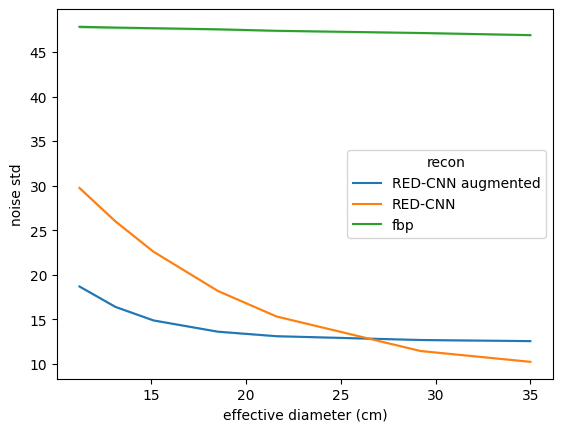

In [9]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter (cm)'] != 20) &
                          (results.phantom=='uniform')], x='effective diameter (cm)', y='noise std', hue='recon')

In [10]:
cols = ['effective diameter (cm)', 'recon', 'Dose [%]']
means = results[[*cols, 'noise std']].groupby(cols).mean()
noise_reductions = []
for idx, row in results.iterrows():
    fbp_noise = means['noise std'][row['effective diameter (cm)'], 'fbp', row['Dose [%]']]
    noise_reductions.append(noise_reduction(fbp_noise, row['noise std']))
results['noise reduction [%]'] = noise_reductions
results

,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std,noise reduction [%]
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,18.704023,74.796682
1,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,18.726599,74.766262
2,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,18.830959,74.625638
3,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,18.895788,74.538282
4,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,18.847178,74.603784
...,...,...,...,...,...,...,...,...,...
75595,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,195,25.886405,-0.188523
75596,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,196,26.063389,-0.873509
75597,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,197,25.690499,0.569695
75598,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,198,25.662384,0.678506


<Axes: xlabel='effective diameter (cm)', ylabel='noise reduction [%]'>

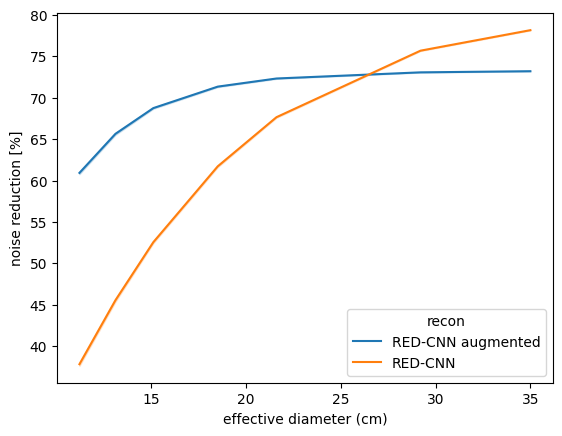

In [11]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter (cm)'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter (cm)', y='noise reduction [%]', hue='recon')

<Axes: xlabel='effective diameter (cm)', ylabel='noise reduction [%]'>

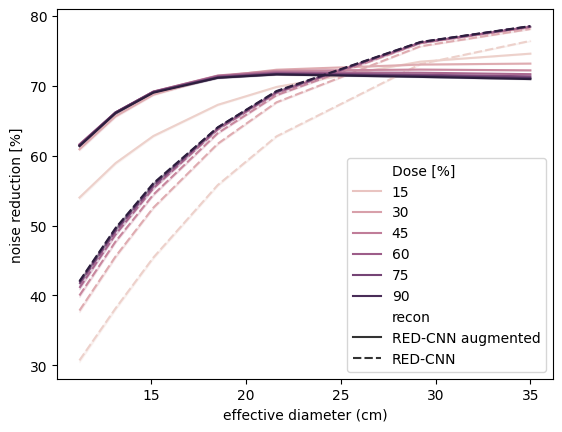

In [12]:
sns.lineplot(data=results[(results['effective diameter (cm)'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter (cm)', y='noise reduction [%]', hue='Dose [%]', style='recon')

Looks like the models behave pretty uniformly for dose levels in between quarter dose (25%) and full dose (100%) but for really low doses below the low dose training inputs, such as 15% dose, both RED-CNN and augmented RED-CNN underperform indicated that going for a dose even lower than what was seen during training is also considered out of distribution whereas doses in between training min and max act as in distribution.

### RMSE Reduction in Uniform Phantoms

The original RED-CNN model was most performant on the larger diameter phantom, but noise reduction dropped in the smaller diameter phantom. However, when augmentation is used in training the noise reduction improves in small phantoms! We can expand these measurements to all uniform phantom sizes to get the follow plot and see that our measures above lie on the far extremes of the plot but the trend persists across sizes

In [13]:
phantom_meta

,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
1,35.0 cm MITA-LCD,35.0,10,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
2,35.0 cm MITA-LCD,35.0,10,fbp,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
3,35.0 cm MITA-LCD,35.0,40,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
4,35.0 cm MITA-LCD,35.0,40,RED-CNN,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
...,...,...,...,...,...,...,...,...
373,15.1 cm uniform,15.1,70,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
374,15.1 cm uniform,15.1,70,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
375,15.1 cm uniform,15.1,85,RED-CNN augmented,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN
376,15.1 cm uniform,15.1,85,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,NaN,NaN


Name                                                        35.0 cm MITA-LCD
effective diameter (cm)                                                 35.0
Dose [%]                                                                  10
recon                                                      RED-CNN augmented
phantom                                                             MITA-LCD
file                       /gpfs_projects/brandon.nelson/PediatricCTSizeD...
sim number                                                               NaN
noise std                                                                NaN
Name: 0, dtype: object


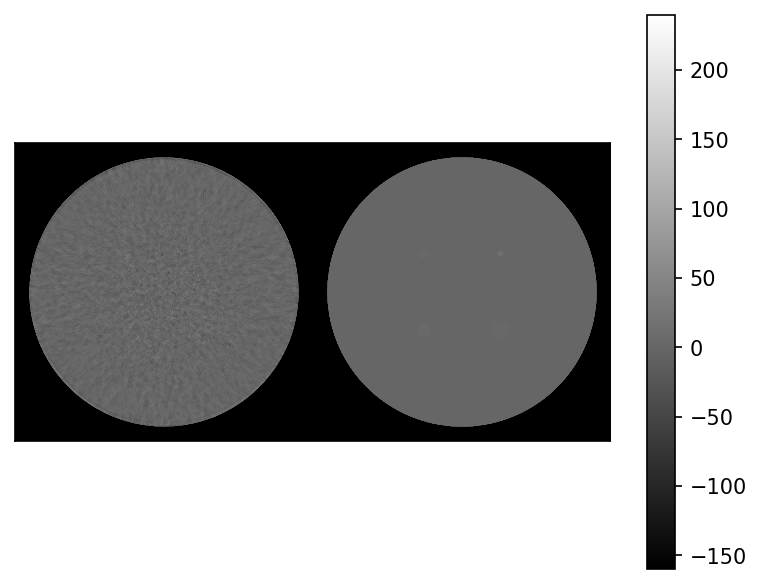

In [14]:
patient = phantom_meta.iloc[0]
offset = 1000 if patient.recon == 'fbp' else 0
img = load_mhd(patient.file) - offset
gt = load_mhd(get_ground_truth(patient.file)) - 1000
print(patient)
plt.figure(dpi=150)
ctshow(np.concatenate([img[1], gt], axis=1))
plt.colorbar()

In [15]:
from utils import measure_rmse_results

In [16]:
results_csv = Path('results.csv')

overwrite_results = True

if results_csv.exists() and not overwrite_results:
    results = pd.read_csv(results_csv)
    phantom_results = results[(results['phantom'] == 'uniform') | (results['phantom'] == 'MITA-LCD')].reset_index(drop=True)
else:
    rmse_results = measure_rmse_results(phantom_meta)
rmse_results
results['rmse'] = rmse_results['rmse']
results

0 / 378
20 / 378
40 / 378
60 / 378
80 / 378
100 / 378
120 / 378
140 / 378
160 / 378
180 / 378
200 / 378
220 / 378
240 / 378
260 / 378
280 / 378
300 / 378
320 / 378
340 / 378
360 / 378


,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std,noise reduction [%],rmse
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,18.704023,74.796682,19.582039
1,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,18.726599,74.766262,19.625437
2,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,18.830959,74.625638,19.694382
3,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,18.895788,74.538282,19.667883
4,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,18.847178,74.603784,19.693256
...,...,...,...,...,...,...,...,...,...,...
75595,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,195,25.886405,-0.188523,22.589197
75596,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,196,26.063389,-0.873509,22.634477
75597,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,197,25.690499,0.569695,22.604654
75598,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,198,25.662384,0.678506,22.41049


In [17]:
cols = ['effective diameter (cm)', 'recon', 'Dose [%]']
means = results[[*cols, 'rmse']].groupby(cols).mean()
rmse_reductions = []
for idx, row in results.iterrows():
    fbp_noise = means['rmse'][row['effective diameter (cm)'], 'fbp', row['Dose [%]']]
    rmse_reductions.append(noise_reduction(fbp_noise, row['rmse']))
results['rmse reduction [%]'] = rmse_reductions
results

,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std,noise reduction [%],rmse,rmse reduction [%]
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,18.704023,74.796682,19.582039,65.279110
1,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,18.726599,74.766262,19.625437,65.202161
2,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,18.830959,74.625638,19.694382,65.079915
3,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,18.895788,74.538282,19.667883,65.126900
4,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,18.847178,74.603784,19.693256,65.081910
...,...,...,...,...,...,...,...,...,...,...,...
75595,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,195,25.886405,-0.188523,22.589197,0.034552
75596,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,196,26.063389,-0.873509,22.634477,-0.165826
75597,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,197,25.690499,0.569695,22.604654,-0.033851
75598,15.1 cm uniform,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,198,25.662384,0.678506,22.41049,0.825397


<Axes: xlabel='effective diameter (cm)', ylabel='rmse'>

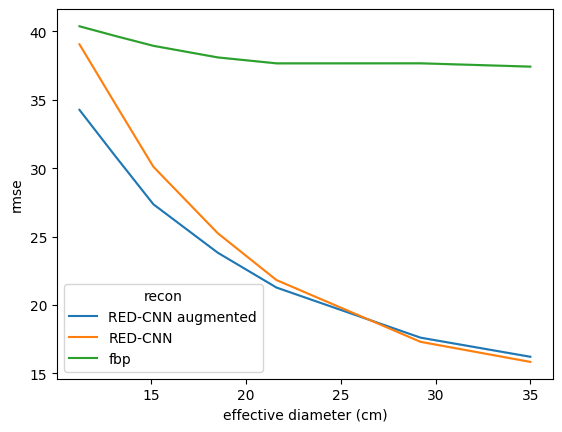

In [18]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter (cm)'] != 20) &
                          (results.phantom=='uniform')], x='effective diameter (cm)', y='rmse', hue='recon')

<Axes: xlabel='effective diameter (cm)', ylabel='rmse reduction [%]'>

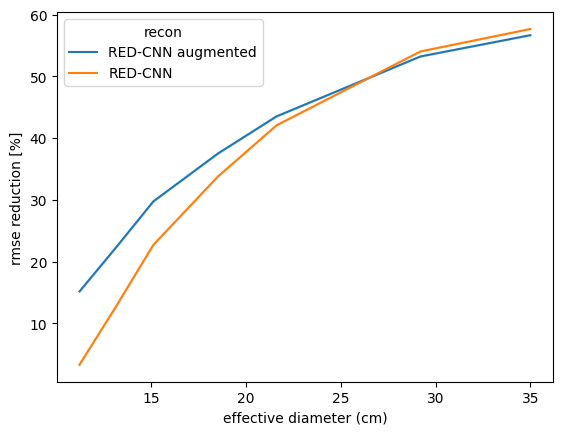

In [19]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                                  (results['effective diameter (cm)'] != 20) &
                                  (results.phantom=='uniform') &
                                  (results.recon != 'fbp')], x='effective diameter (cm)', y='rmse reduction [%]', hue='recon')

Compared to noise reduction, there isn't as much of a performance gap in adults when measuring RMSE

<Axes: xlabel='effective diameter (cm)', ylabel='rmse'>

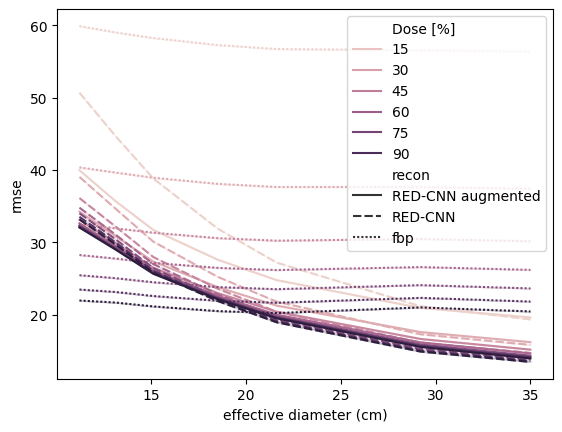

In [20]:
sns.lineplot(data=results[(results['effective diameter (cm)'] != 20) &
                                  (results.phantom=='uniform')], x='effective diameter (cm)', y='rmse', hue='Dose [%]', style='recon')

<Axes: xlabel='effective diameter (cm)', ylabel='rmse reduction [%]'>

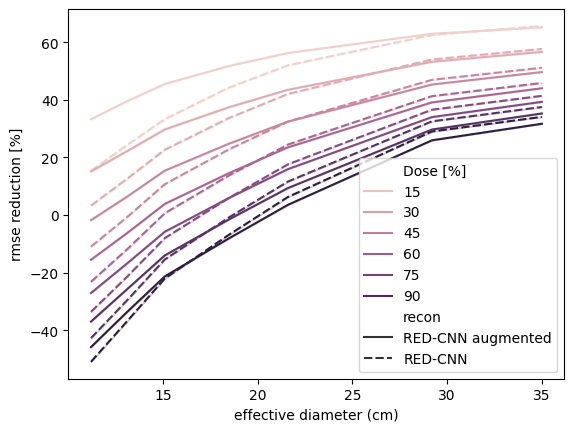

In [21]:
sns.lineplot(data=results[(results['effective diameter (cm)'] != 20) &
                                  (results.phantom=='uniform') &
                                  (results.recon != 'fbp')], x='effective diameter (cm)', y='rmse reduction [%]', hue='Dose [%]', style='recon')

### Side investigation: comparison of adding noise to training vs adding back part of the fbp image?
**TODO** Need to confirm that training side data augmentation is not inferior to just adding back some noise as done above^

In [22]:
results.head()

,Name,effective diameter (cm),Dose [%],recon,phantom,file,sim number,noise std,noise reduction [%],rmse,rmse reduction [%]
0,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,18.704023,74.796682,19.582039,65.279110
1,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,18.726599,74.766262,19.625437,65.202161
2,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,18.830959,74.625638,19.694382,65.079915
3,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,18.895788,74.538282,19.667883,65.126900
4,35.0 cm MITA-LCD,35.0,10,RED-CNN augmented,MITA-LCD,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,18.847178,74.603784,19.693256,65.081910


In [23]:
redaug_img = load_mhd(results[(results.recon=='RED-CNN augmented') &
                              (results['Dose [%]']==25) &
                              (results['effective diameter (cm)']==35) &
                              (results['phantom'] == 'uniform')].iloc[0].file)

red_img = load_mhd(results[(results.recon=='RED-CNN') &
                           (results['Dose [%]']==25) &
                           (results['effective diameter (cm)']==35) &
                           (results['phantom'] == 'uniform')].iloc[0].file)

fbp_img = load_mhd(results[(results.recon=='fbp') &
                           (results['Dose [%]']==25) &
                           (results['effective diameter (cm)']==35) &
                           (results['phantom'] == 'uniform')].iloc[0].file).astype('float32') - 1000

add_back = red_img + 0.35*(fbp_img - red_img)

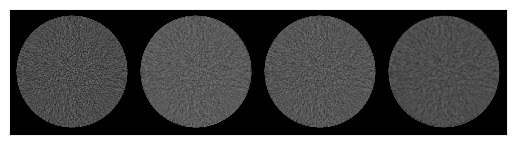

In [24]:
wwwl = (100, 20)
ctshow(np.concatenate([fbp_img[0], red_img[0], add_back[0], redaug_img[0]], axis=1), wwwl)

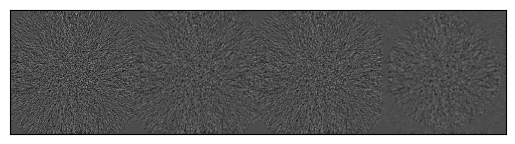

In [25]:
wwwl = (100, 20)
ctshow(np.concatenate([fbp_img[0]-fbp_img[1], red_img[0]-red_img[1], add_back[0]-add_back[1], redaug_img[0]-redaug_img[1]], axis=1), wwwl)

In [26]:
[o.std() for o in [fbp_img[0]-fbp_img[1], red_img[0]-red_img[1], add_back[0]-add_back[1], redaug_img[0]-redaug_img[1]]]

[51.399006, 12.3216505, 24.977684, 14.768357]

## Noise Reduction in Anthropomorphic Phantoms

Because ground truth is known we can evaluate noise removal as root mean squared error (RMSE) reduction.

In [27]:
anthro_meta = pd.read_csv(anthro_dir / 'metadata.csv')
anthro_meta.file = anthro_meta.file.apply(lambda o: anthro_dir / o)
anthro_meta

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.100000,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.100000,36.0,NaN,11.1,10,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.100000,36.0,NaN,11.1,10,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.100000,36.0,NaN,11.1,40,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.100000,36.0,NaN,11.1,40,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,151,female pt151,66.000,F,66.4,162.0,25.301021,48.8,white,28.1,70,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
416,151,female pt151,66.000,F,66.4,162.0,25.301021,48.8,white,28.1,70,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
417,151,female pt151,66.000,F,66.4,162.0,25.301021,48.8,white,28.1,85,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
418,151,female pt151,66.000,F,66.4,162.0,25.301021,48.8,white,28.1,85,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...


Let's look at a random study of the 420 available...

Code #                                                     Reference newborn
Name                                                             male infant
age (year)                                                             0.166
gender                                                                     M
weight (kg)                                                              3.8
height (cm)                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter (cm)                                                 11.1
Dose [%]                                                                  10
recon                                                                    fbp
phantom                                                      anthropomorphic

Text(0.5, 1.0, '10% dose fbp | ground truth')

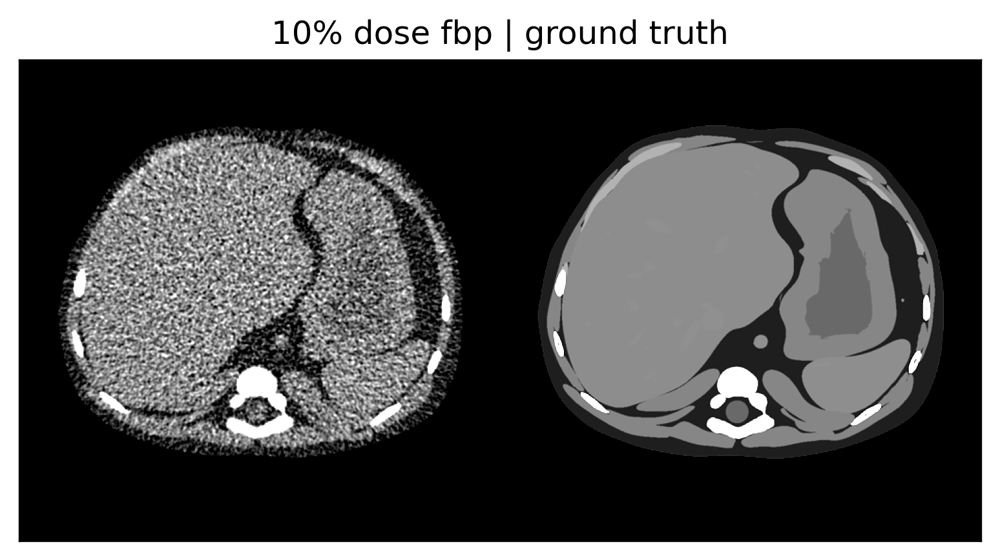

In [28]:
patient = anthro_meta.iloc[np.random.randint(len(anthro_meta))]
offset = 1000 if patient.recon == 'fbp' else 0
img = load_mhd(patient.file) - offset
gt = load_mhd(get_ground_truth(patient.file)) - 1000
plt.figure(dpi=300)
print(patient)
ctshow(np.concatenate([img[1], gt], axis=1))
plt.title(f"{patient['Dose [%]']}% dose {patient.recon} | ground truth")

We calculate RMSE by comparing the reconstructed image on the left to the ground truth on the right

In [29]:
overwrite_results = True
if results_csv.exists() and not overwrite_results:
    anthro_results = results[(results['phantom'] == 'anthropomorphic')]
else:
    anthro_results = measure_rmse_results(anthro_meta)
    anthro_results['phantom'] = 'anthropomorphic' # or XCAT
anthro_results

0 / 420
20 / 420
40 / 420
60 / 420
80 / 420
100 / 420
120 / 420
140 / 420
160 / 420
180 / 420
200 / 420
220 / 420
240 / 420
260 / 420
280 / 420
300 / 420
320 / 420
340 / 420
360 / 420
380 / 420
400 / 420


,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,5,29.399138
4196,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,6,29.340426
4197,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,7,29.34036
4198,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,8,29.411117


### Noise std Reduction in Anthropomorphic Phantoms

Calculating noise reduction using standard deviation ROI measurements is slightly more complicated due to the more heterogenous anthropmorphic phantoms. To ensure we are sampling a uniform region and not a boundary region which will give a high std value but not be indicative of noise, we will use this `add_random_circle_lesion` function which takes as an optional argument a `mask` to specify a domain to place the random roi within. 

In [30]:
from utils import add_random_circle_lesion

In [31]:
add_random_circle_lesion?

Signature: add_random_circle_lesion(image, mask, radius=20, contrast=-100)
Docstring:
Returns tuple of (image with lesion, lesion only image, lesion coordinate (x,y))
:tol: tolerance of fitting lesion into mask, smaller values increases the requirement ensuring more of the circle overlaps with the mask
File:      ~/Dev/PediatricCTSizeAugmentation/notebooks/utils.py
Type:      function

Below we can experiment with some reasonable HU cutoffs to get the liver, note we are doing these thresholds on the ground truth `gt` image so noise is not a factor when getting the mask.

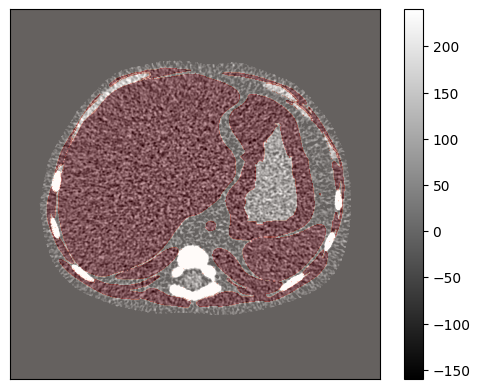

In [32]:
ctshow(img[0])
plt.colorbar()
mask = (gt >= 50) & (gt < 100)
plt.imshow(mask, alpha=0.4, cmap='Reds') 

By rerunning the cell below multiple times we see the ROI stays in the liver but in different locations each time

Text(0.5, 1.0, 'mean: 61 HU\nstd: 76 HU')

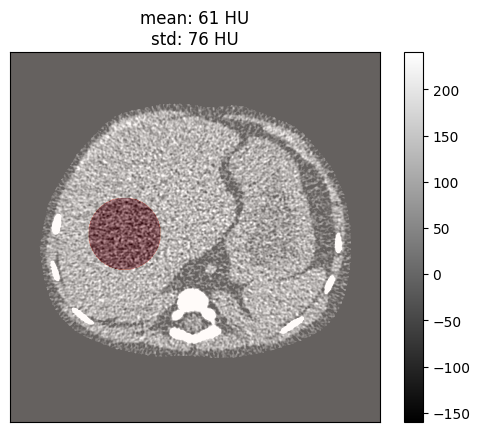

In [33]:
circle_selection = add_random_circle_lesion(img[0], mask, radius=50)[1].astype(bool)
ctshow(img[0])
plt.colorbar()
mask = (gt >= 50) & (gt < 100)
plt.imshow(circle_selection, alpha=0.4, cmap='Reds')
plt.title(f'mean: {img[0][circle_selection].mean():2.0f} HU\nstd: {img[0][circle_selection].std():2.0f} HU')

This `add_random_circle_lesion` is built into the `make_montage` visualization function to qualitatively compare noise magnitude reduction across reconstruction types, patient size and other parameters

In [34]:
make_montage?

Signature:
make_montage(
    meta_df: pandas.core.frame.DataFrame,
    dose: int = 25,
    diameters: list = [35.0, 11.2],
    recons: list = ['fbp', 'RED-CNN', 'RED-CNN augmented'],
    phantom: str = 'MITA-LCD',
    roi_diameter: float | int = 0.4,
    roi_center: tuple | str = (256, 256),
    wwwl=(80, 0),
)
Docstring:
make image montage based on given argument parameters. Recons are plotted horizontally along the x axis while different diameters are plotted on y
:Parameters:
    :meta_df: metadata dataframe
    :dose: dose level in percent [%]
    :diameters: phantom effective diameter in cm
    :recons: list of recon kernels to display on the horizontal x-axis
    :phantom: which image phantom is expected ['MITA-LCD', 'uniform', 'anthropomorphic'], it should be in meta_df
    :roi_diameter: diameter of circlular ROI. If `roi_diameter` is an **integer** then roi_diameter is in pixels e.g. 100, else if `roi_diameter` is **float** e.g. 0.3 then it is assumed a fraction of the phantom

The doc strings describe that rois can be manually placed using a `tuple` as shown below with `roi_center = (x, y)`

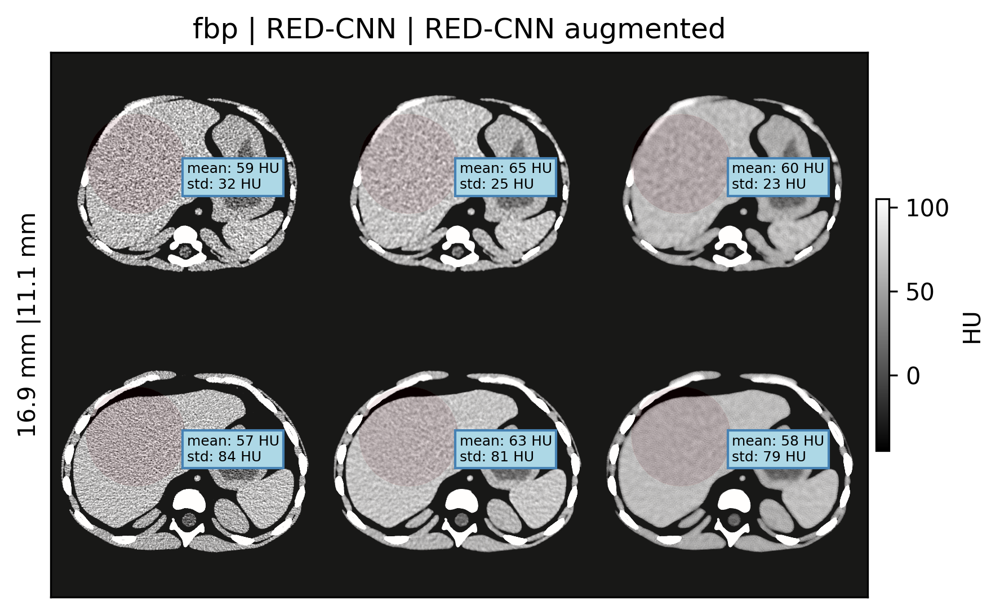

In [35]:
plt.figure(dpi=300)
make_montage(anthro_meta, dose=100, phantom='anthropomorphic', diameters=[11.1, 16.9], wwwl=(150, 30), roi_center=(210, 160))

Or alternatively an organ can be specified if using an anthropomorphic phantom and an ROI will be randomly place in that ROI, this is useful for the anthropomorphic phantoms because due to size and placement differences between scans the same roi xy coordinates might not always be in the liver

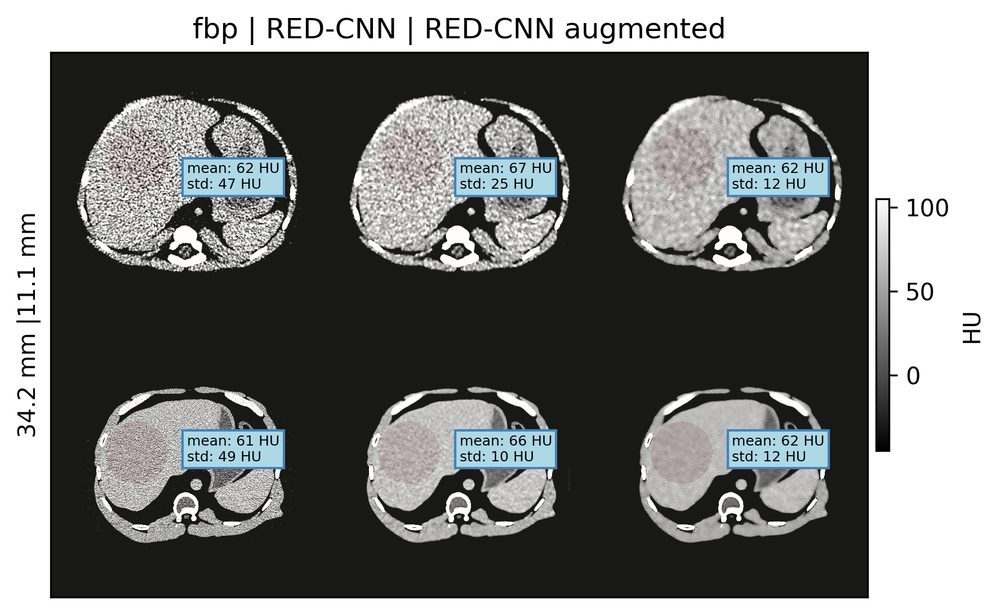

In [36]:
plt.figure(dpi=300)
make_montage(anthro_meta, dose=25, phantom='anthropomorphic', diameters=[11.1, 34.2], wwwl=(150, 30), roi_center='liver', roi_diameter=0.25)

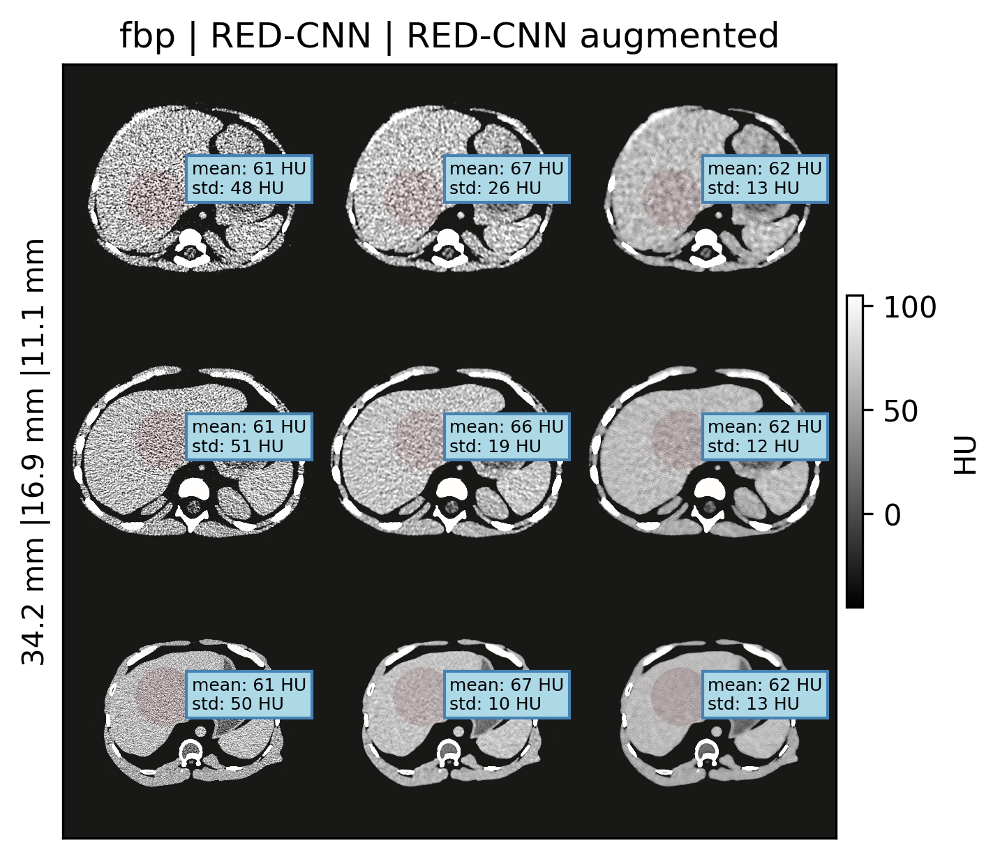

In [37]:
plt.figure(dpi=300)
make_montage(anthro_meta, dose=25, phantom='anthropomorphic', diameters=[11.1, 16.9, 34.2], wwwl=(150, 30), roi_center='liver', roi_diameter=0.25)

In [38]:
from utils import measure_roi_std_results

In [39]:
anthro_std_results = measure_roi_std_results(anthro_meta, roi_diameter=0.2)
anthro_results['noise std'] = anthro_std_results['noise std']
anthro_results

0 / 420
20 / 420
40 / 420
60 / 420
80 / 420
100 / 420
120 / 420
140 / 420
160 / 420
180 / 420
200 / 420
220 / 420
240 / 420
260 / 420
280 / 420
300 / 420
320 / 420
340 / 420
360 / 420
380 / 420
400 / 420


,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,5,29.399138,27.181859
4196,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,6,29.340426,27.300394
4197,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,7,29.34036,27.162658
4198,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,8,29.411117,27.204642


This anthropomorphic images are supposed to be around the liver, which is uniform so there should be enough space on each image to sample a large circle roi for noise measures

### RMSE Reduction in Anthropmorphic Phantoms

In [40]:
cols = ['effective diameter (cm)', 'recon', 'Dose [%]']
means = anthro_results[[*cols, 'rmse']].groupby(cols).mean()
rmse_reductions = []
for idx, row in anthro_results.iterrows():
    fbp_noise = means['rmse'][row['effective diameter (cm)'], 'fbp', row['Dose [%]']]
    rmse_reductions.append(noise_reduction(fbp_noise, row['rmse']))
anthro_results['rmse reduction [%]'] = rmse_reductions
anthro_results

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std,rmse reduction [%]
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309,36.982130
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268,36.775716
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094,36.943534
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855,37.185656
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407,37.686467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,5,29.399138,27.181859,-0.111472
4196,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,6,29.340426,27.300394,0.088458
4197,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,7,29.34036,27.162658,0.088683
4198,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,8,29.411117,27.204642,-0.152264


In [41]:
cols = ['effective diameter (cm)', 'recon', 'Dose [%]']
means = anthro_results[[*cols, 'noise std']].groupby(cols).mean()
rmse_reductions = []
for idx, row in anthro_results.iterrows():
    fbp_noise = means['noise std'][row['effective diameter (cm)'], 'fbp', row['Dose [%]']]
    rmse_reductions.append(noise_reduction(fbp_noise, row['noise std']))
anthro_results['noise reduction [%]'] = rmse_reductions
anthro_results

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std,rmse reduction [%],noise reduction [%]
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309,36.982130,68.215286
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268,36.775716,65.881842
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094,36.943534,65.460509
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855,37.185656,70.097977
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407,37.686467,70.852177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,5,29.399138,27.181859,-0.111472,0.576993
4196,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,6,29.340426,27.300394,0.088458,0.143427
4197,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,7,29.34036,27.162658,0.088683,0.647226
4198,151,female pt151,66.0,F,66.4,162.0,25.301021,48.8,white,28.1,85,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,8,29.411117,27.204642,-0.152264,0.493659


In [42]:
results = pd.concat([anthro_results, results])
results.to_csv('results.csv', index=False)
results

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std,rmse reduction [%],noise reduction [%]
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309,36.982130,68.215286
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268,36.775716,65.881842
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094,36.943534,65.460509
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855,37.185656,70.097977
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407,37.686467,70.852177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75595,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,195,22.589197,25.886405,0.034552,-0.188523
75596,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,196,22.634477,26.063389,-0.165826,-0.873509
75597,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,197,22.604654,25.690499,-0.033851,0.569695
75598,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,198,22.41049,25.662384,0.825397,0.678506


## Putting it all together: plotting trends

In [43]:
anthro_results['is adult'] = anthro_results['age (year)'] >= 22

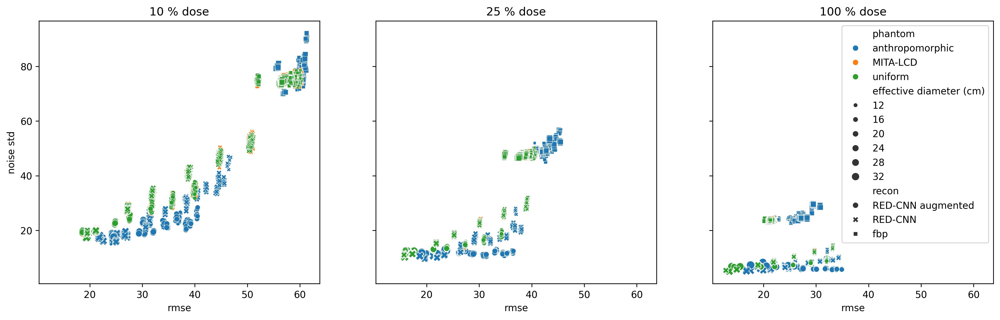

In [44]:
f, axs = plt.subplots(1, 3, dpi=300, sharex=True, sharey=True, figsize=(18,5))
for ax, dose in zip(axs, [10, 25, 100]):
    legend = False if dose < 100 else True
    sns.scatterplot(ax=ax, data=results[results['Dose [%]']==dose], x='rmse', y='noise std', hue='phantom', style='recon', size='effective diameter (cm)', legend=legend)
    ax.set_title(f'{dose} % dose')

Do RMSE and noise correlate? For the most part yes, (not sure if this plot is super valuable but it addresses the previous point)

<Axes: xlabel='age (year)', ylabel='weight (kg)'>

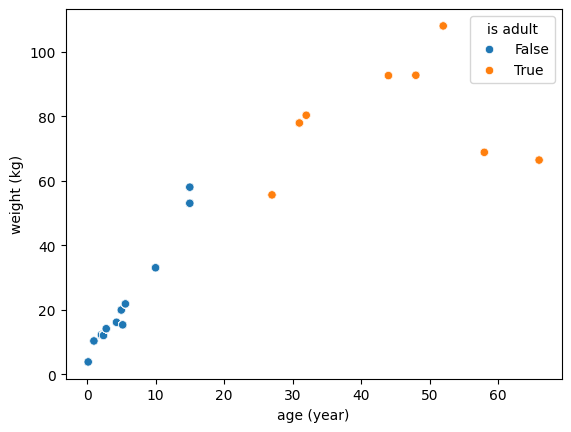

In [45]:
import seaborn as sns
sns.scatterplot(data=anthro_results, x='age (year)', y='weight (kg)', hue='is adult')

<Axes: xlabel='age (year)', ylabel='effective diameter (cm)'>

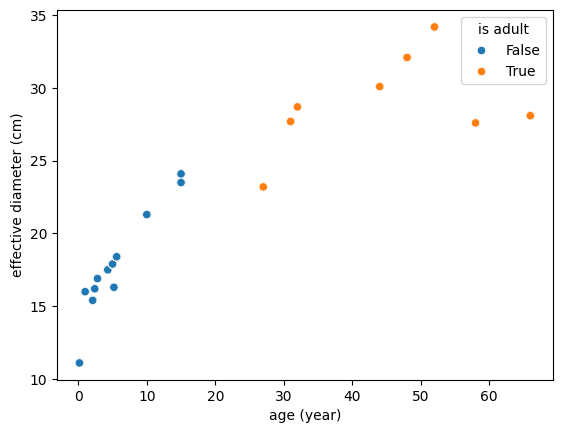

In [46]:
sns.scatterplot(data=anthro_results, x='age (year)', y='effective diameter (cm)', hue='is adult')

In [47]:
len(anthro_results[anthro_results['is adult']==True].Name.unique()), len(anthro_results[anthro_results['is adult']==False].Name.unique())

(8, 12)

In [48]:
sys.path.append('../..')
from noise_assessments import order_recons
recon_order = order_recons(anthro_results.recon.unique())

<Axes: xlabel='effective diameter (cm)', ylabel='rmse'>

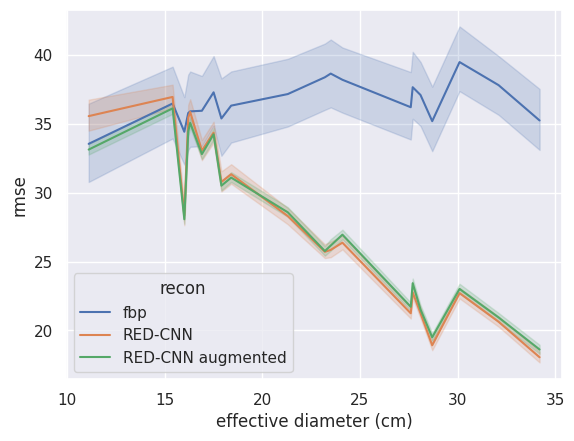

In [49]:
sns.lineplot(data=anthro_results, x='effective diameter (cm)', y='rmse', hue='recon', hue_order=recon_order)

^^ Check out some representative values and images to see that everything makes sense

In [50]:
anthro_results.sort_values(by=['effective diameter (cm)', 'Dose [%]'])

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std,rmse reduction [%],noise reduction [%],is adult
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309,36.982130,68.215286,False
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268,36.775716,65.881842,False
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094,36.943534,65.460509,False
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855,37.185656,70.097977,False
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407,37.686467,70.852177,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3715,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,34.2,100,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,5,26.925217,24.784031,-0.091061,-0.508645,True
3716,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,34.2,100,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,6,26.88938,24.607733,0.042156,0.206312,True
3717,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,34.2,100,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,7,26.87252,24.571756,0.104834,0.352211,True
3718,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,34.2,100,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,8,26.918845,24.709153,-0.067377,-0.204986,True


<Axes: xlabel='effective diameter (cm)', ylabel='rmse reduction [%]'>

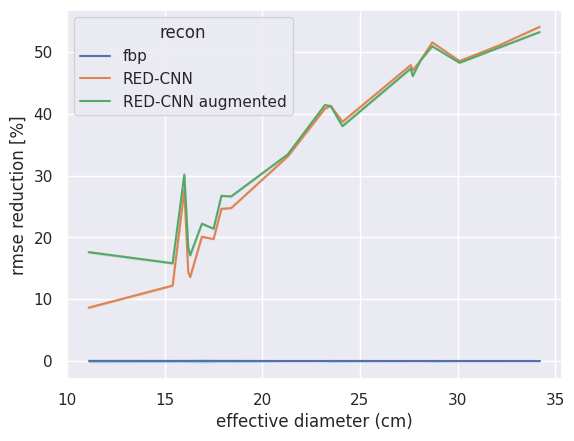

In [51]:
sns.lineplot(data=anthro_results[anthro_results['Dose [%]']==25], x='effective diameter (cm)', y='rmse reduction [%]', hue='recon', hue_order=recon_order)

<Axes: xlabel='effective diameter (cm)', ylabel='noise reduction [%]'>

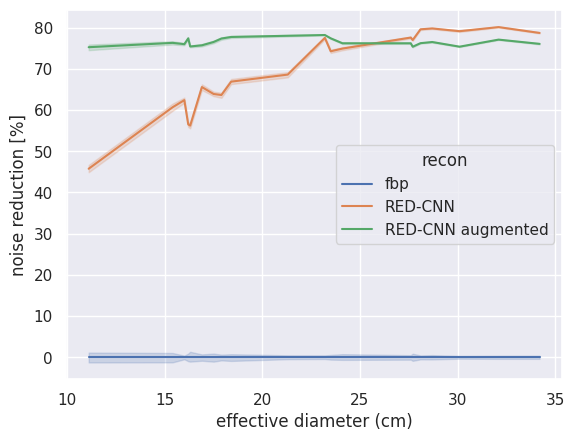

In [52]:
sns.lineplot(data=anthro_results[anthro_results['Dose [%]']==25], x='effective diameter (cm)', y='noise reduction [%]', hue='recon', hue_order=recon_order)

In [53]:
infant = anthro_results[(anthro_results.Name == 'male infant')]
infant.head()

,Code #,Name,age (year),gender,weight (kg),height (cm),BMI,weight percentile,ethnicity,effective diameter (cm),Dose [%],recon,phantom,file,sim number,rmse,noise std,rmse reduction [%],noise reduction [%],is adult
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,0,37.202656,24.504309,36.982130,68.215286,False
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,1,37.324512,26.303268,36.775716,65.881842,False
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,2,37.225441,26.628094,36.943534,65.460509,False
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,3,37.082504,23.052855,37.185656,70.097977,False
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...,4,36.78685,22.471407,37.686467,70.852177,False


In [54]:
infant_study = anthro_results[(anthro_results.Name == 'male infant') & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='fbp')].iloc[0]
print(infant_study)
infant_img = load_mhd(anthro_dir / infant_study.file)[0] - 1000
infant_base_denoised =  load_mhd(anthro_dir / anthro_results[(anthro_results.Name == 'male infant') & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='RED-CNN')].iloc[0].file)[0]
infant_aug_denoised =  load_mhd(anthro_dir / anthro_results[(anthro_results.Name == 'male infant') & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='RED-CNN augmented')].iloc[0].file)[0]
infant_gt = load_mhd(anthro_dir / get_ground_truth(infant_study.file)) - 1000

Code #                                                     Reference newborn
Name                                                             male infant
age (year)                                                             0.166
gender                                                                     M
weight (kg)                                                              3.8
height (cm)                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter (cm)                                                 11.1
Dose [%]                                                                  25
recon                                                                    fbp
phantom                                                      anthropomorphic

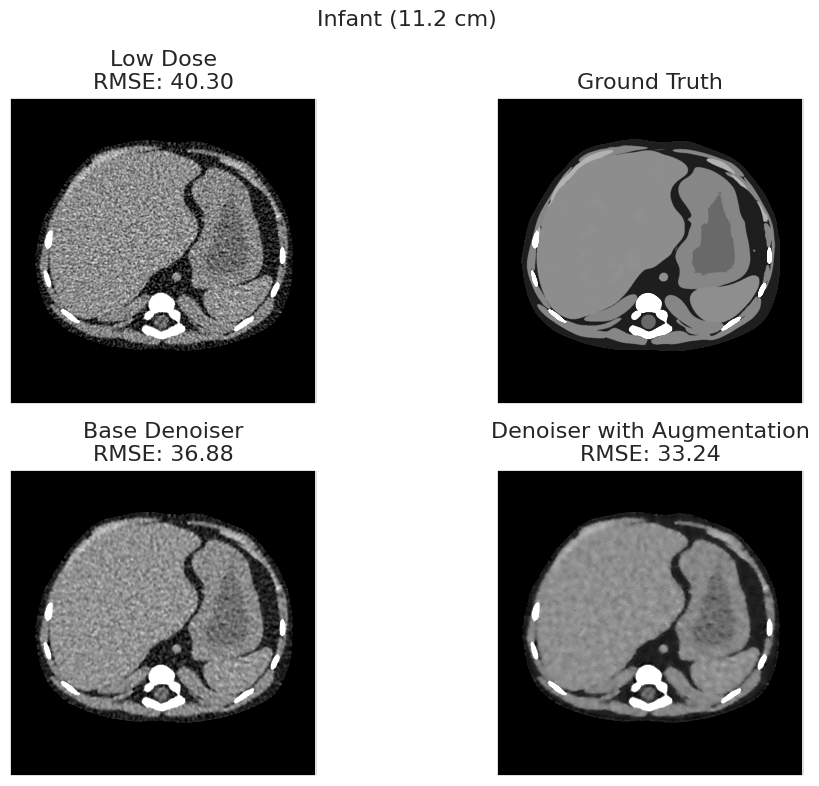

In [56]:
from utils import rmse
plt.figure(figsize=(16, 8), tight_layout=True)
plt.suptitle('Infant (11.2 cm)', fontsize=16)

plt.subplot(2, 2, 1)
plt.title(f'Low Dose\nRMSE: {rmse(infant_img, infant_gt):2.2f}', fontsize=16)
ctshow(infant_img.squeeze())

plt.subplot(2, 2, 2)
plt.title('Ground Truth', fontsize=16)
ctshow(infant_gt.squeeze())

plt.subplot(2, 2, 3)
plt.title(f'Base Denoiser\nRMSE: {rmse(infant_base_denoised, infant_gt):2.2f}', fontsize=16)
ctshow(infant_base_denoised.squeeze())

plt.subplot(2, 2, 4)
plt.title(f'Denoiser with Augmentation\nRMSE: {rmse(infant_aug_denoised, infant_gt):2.2f}', fontsize=16)
ctshow(infant_aug_denoised.squeeze())

In [57]:
name = 'male pt148'
adult_study = anthro_results[(anthro_results.Name == name) & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='fbp')].iloc[0]
print(adult_study)
adult_img = load_mhd(anthro_dir / adult_study.file)[0] - 1000
adult_base_denoised =  load_mhd(anthro_dir / anthro_results[(anthro_results.Name == 'male pt148') & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='RED-CNN')].iloc[0].file)[0]
adult_aug_denoised =  load_mhd(anthro_dir / anthro_results[(anthro_results.Name == 'male pt148') & (anthro_results['Dose [%]'] == 25) & (anthro_results.recon=='RED-CNN augmented')].iloc[0].file)[0]
adult_gt = load_mhd(anthro_dir / get_ground_truth(adult_study.file)) - 1000

Code #                                                                   148
Name                                                              male pt148
age (year)                                                              52.0
gender                                                                     M
weight (kg)                                                            108.0
height (cm)                                                            183.2
BMI                                                                    32.18
weight percentile                                                       92.5
ethnicity                                                              white
effective diameter (cm)                                                 34.2
Dose [%]                                                                  25
recon                                                                    fbp
phantom                                                      anthropomorphic

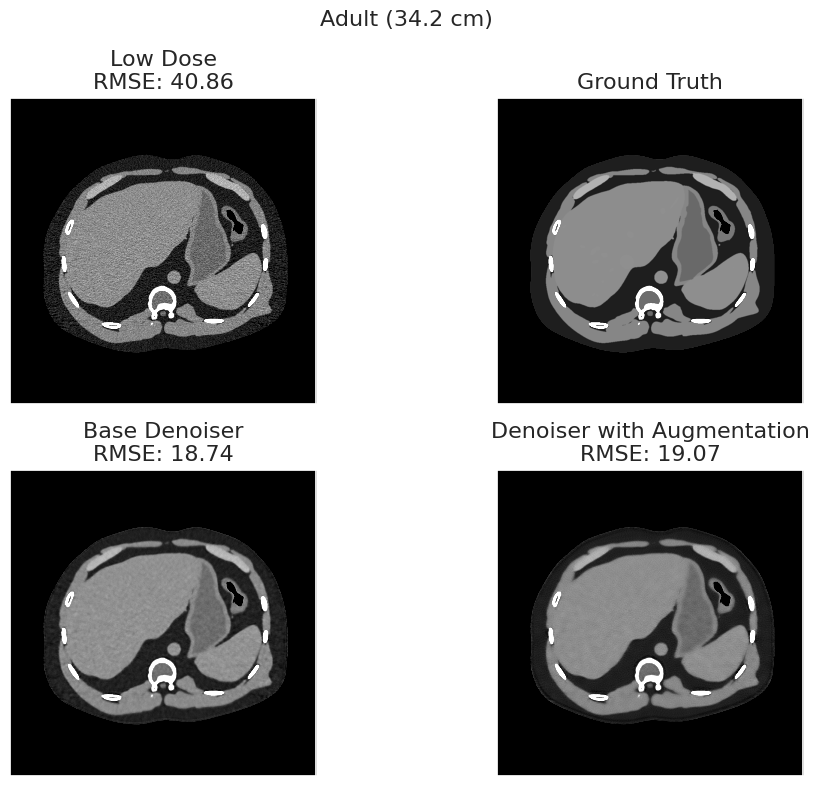

In [58]:
plt.figure(figsize=(16, 8), tight_layout=True)
plt.suptitle('Adult (34.2 cm)', fontsize=16)

plt.subplot(2, 2, 1)
plt.title(f'Low Dose\nRMSE: {rmse(adult_img, adult_gt):2.2f}', fontsize=16)
ctshow(adult_img.squeeze())

plt.subplot(2, 2, 2)
plt.title('Ground Truth', fontsize=16)
ctshow(adult_gt.squeeze())

plt.subplot(2, 2, 3)
plt.title(f'Base Denoiser\nRMSE: {rmse(adult_base_denoised, adult_gt):2.2f}', fontsize=16)
ctshow(adult_base_denoised.squeeze())

plt.subplot(2, 2, 4)
plt.title(f'Denoiser with Augmentation\nRMSE: {rmse(adult_aug_denoised, adult_gt):2.2f}', fontsize=16)
ctshow(adult_aug_denoised.squeeze())

Make these images for a range of sizes infant to adult and [plot RMSE as a function of size](https://github.com/bnel1201/Ped-ETK/blob/main/evaluation/iq_phantom_validation.py) (similar to in [Nelson et al 2022](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.16901)), I want to see another line with augmentation improve that trend

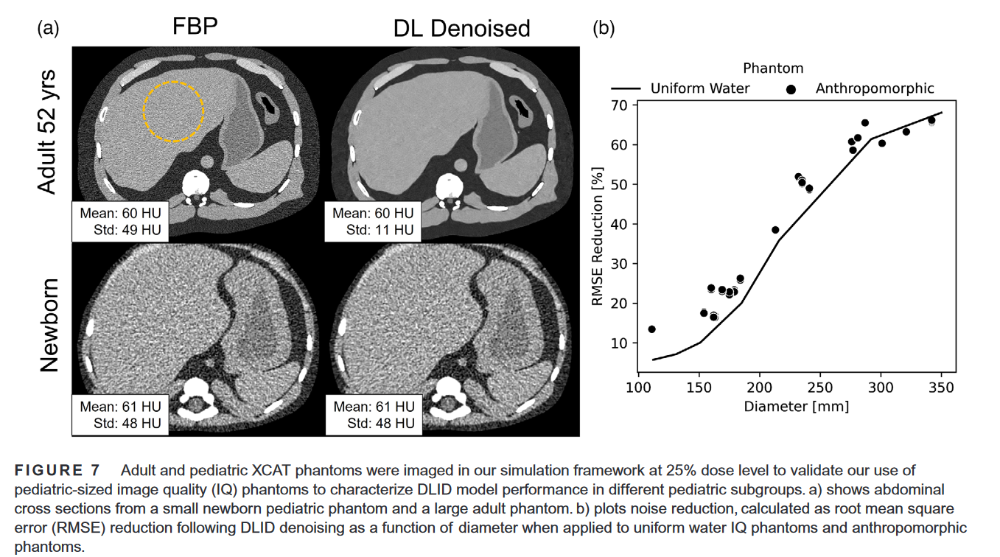

In [59]:
import seaborn as sns

<Axes: xlabel='effective diameter (cm)', ylabel='rmse'>

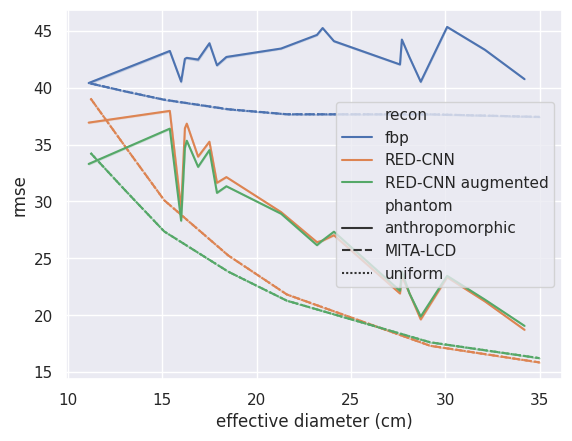

In [60]:
recons = order_recons(results.recon.unique())
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter (cm)'] != 20)], x='effective diameter (cm)', y='rmse', style='phantom', hue='recon', hue_order=recons) 

<Axes: xlabel='effective diameter (cm)', ylabel='rmse reduction [%]'>

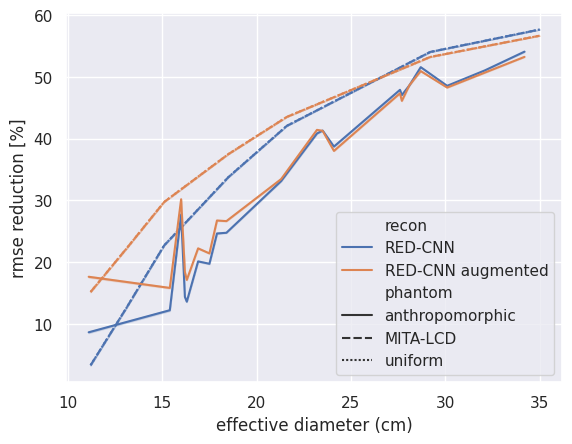

In [61]:
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter (cm)'] != 20) & (results['recon'] != 'fbp')], x='effective diameter (cm)', y='rmse reduction [%]', style='phantom', hue='recon', hue_order=recons[1:]) 

<Axes: xlabel='effective diameter (cm)', ylabel='noise std'>

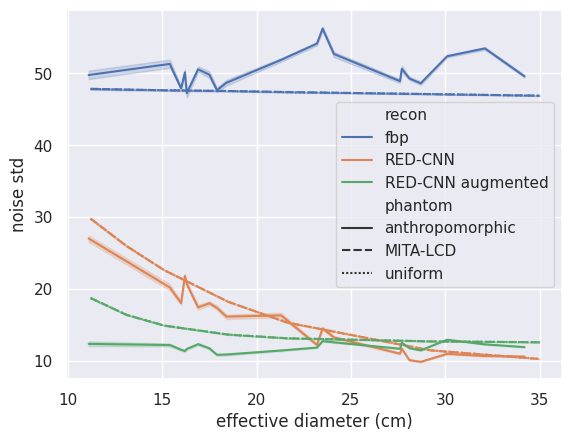

In [62]:
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter (cm)'] != 20)], x='effective diameter (cm)', y='noise std', style='phantom', hue='recon', hue_order=recons) 

<Axes: xlabel='effective diameter (cm)', ylabel='noise reduction [%]'>

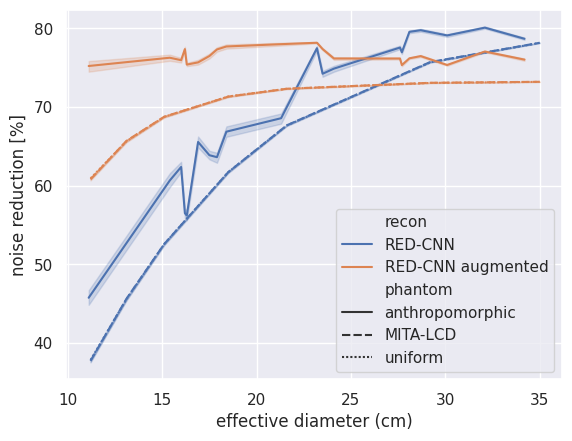

In [63]:
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter (cm)'] != 20)], x='effective diameter (cm)', y='noise reduction [%]', style='phantom', hue='recon', hue_order=recons[1:]) 

It was aliasing! this shows tha the anthropomorphic does track with uniform and that augmentation does help the smallest patients in terms of RMSE reduction as well

Code #                                                     Reference newborn
Name                                                             male infant
age (year)                                                             0.166
gender                                                                     M
weight (kg)                                                              3.8
height (cm)                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter (cm)                                                 11.1
Dose [%]                                                                 100
recon                                                                RED-CNN
phantom                                                      anthropomorphic

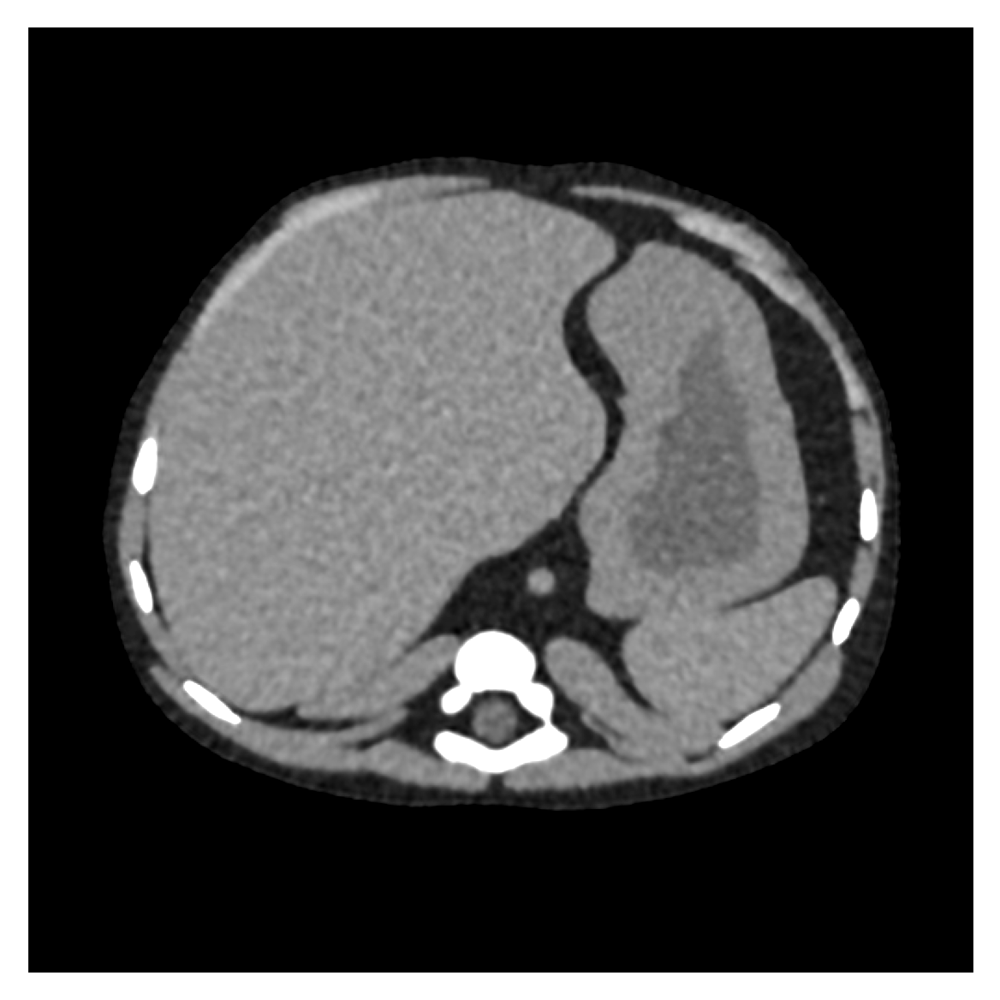

In [64]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') ].sort_values(by='rmse reduction [%]').iloc[0]
print(patient)
plt.figure(dpi=300)
ctshow(load_mhd(anthro_dir / patient.file)[0])

Code #                                                     Reference newborn
Name                                                             male infant
age (year)                                                             0.166
gender                                                                     M
weight (kg)                                                              3.8
height (cm)                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter (cm)                                                 11.1
Dose [%]                                                                  25
recon                                                                RED-CNN
phantom                                                      anthropomorphic

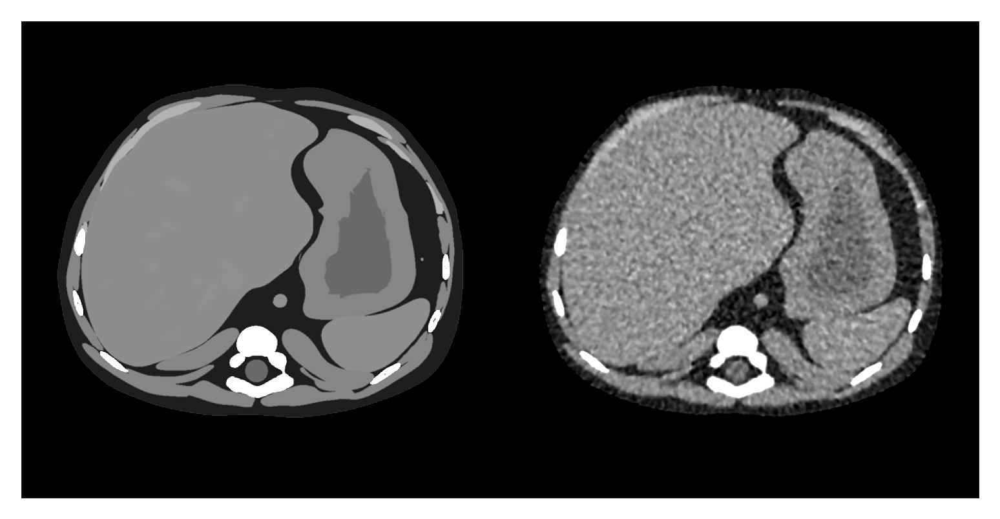

In [65]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') & (results['Dose [%]'] == 25)].sort_values(by='rmse reduction [%]').iloc[0]
print(patient)
img = load_mhd(anthro_dir / patient.file)[0] 
gt = load_mhd(anthro_dir / get_ground_truth(patient.file)) - 1000
plt.figure(dpi=300)
ctshow(np.concatenate([gt, img], axis=1))

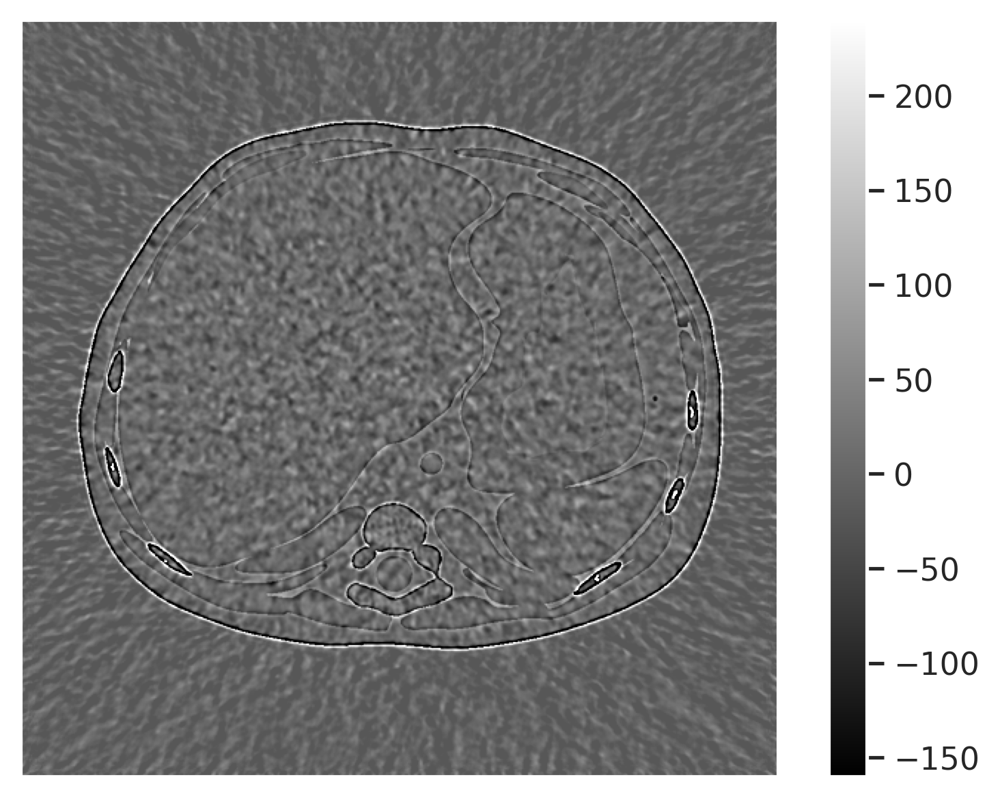

In [66]:
plt.figure(dpi=300)
ctshow(img-gt)
plt.colorbar()

Code #                                                                   148
Name                                                              male pt148
age (year)                                                              52.0
gender                                                                     M
weight (kg)                                                            108.0
height (cm)                                                            183.2
BMI                                                                    32.18
weight percentile                                                       92.5
ethnicity                                                              white
effective diameter (cm)                                                 34.2
Dose [%]                                                                  25
recon                                                                RED-CNN
phantom                                                      anthropomorphic

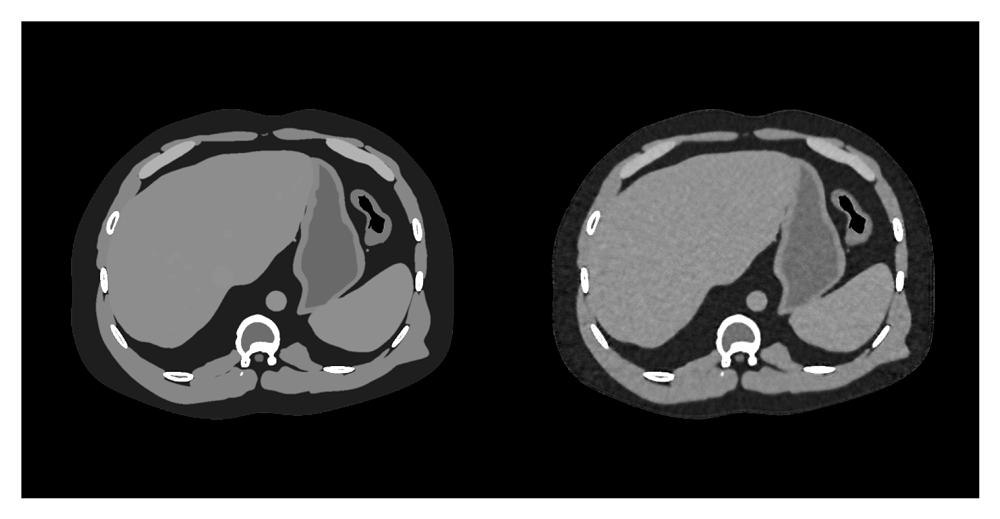

In [67]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') & (results['Dose [%]'] == 25)].sort_values(by='rmse reduction [%]').iloc[-1]
print(patient)
img = load_mhd(anthro_dir / patient.file)[0] 
gt = load_mhd(anthro_dir / get_ground_truth(patient.file)) - 1000
plt.figure(dpi=300)
ctshow(np.concatenate([gt, img], axis=1))

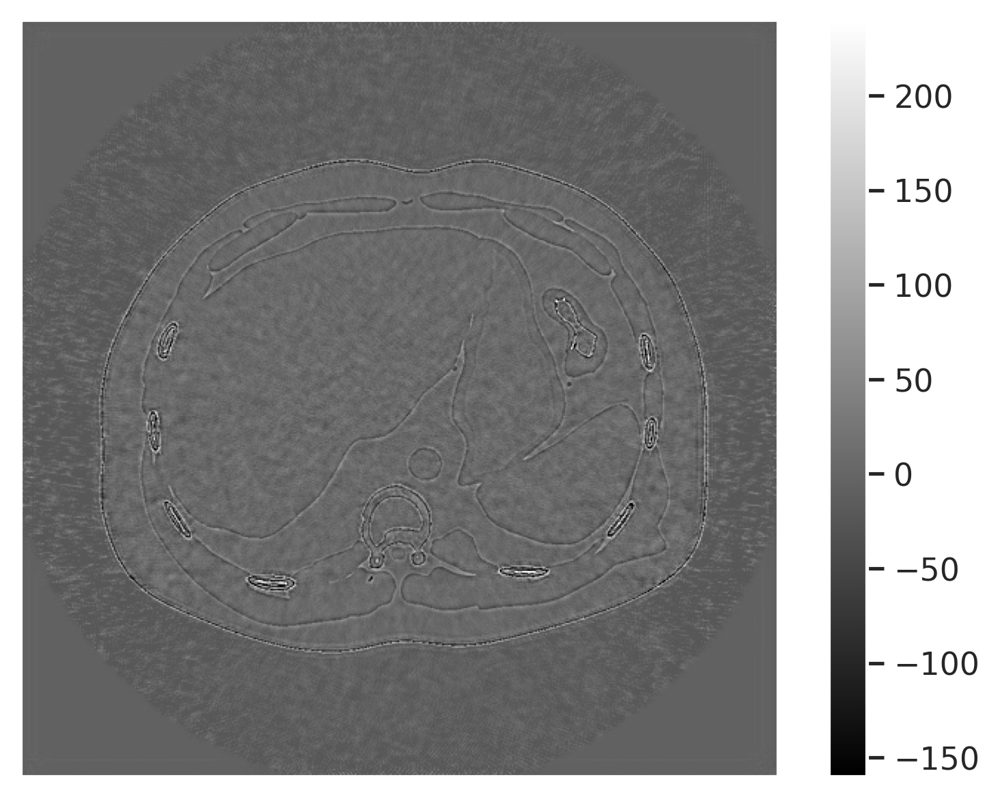

In [68]:
plt.figure(dpi=300)
ctshow(img-gt)
plt.colorbar()

**Why is it that infants have greater RMSE reduction than adults? This is contrary to the previous paper...**

ALIASING?? Could that be it, but im using the same phantoms (in the previous paper I used the *true* phantom - free of aliasing as the truth, not the noiseless one), trying using true.mhd rather than noise free 

Yes it was aliasing, the one mystery remaining is why anthro slightly overperformed in the paper and now slightly under performs, this could be a noise thing or a definition thing but its not as big of a deal

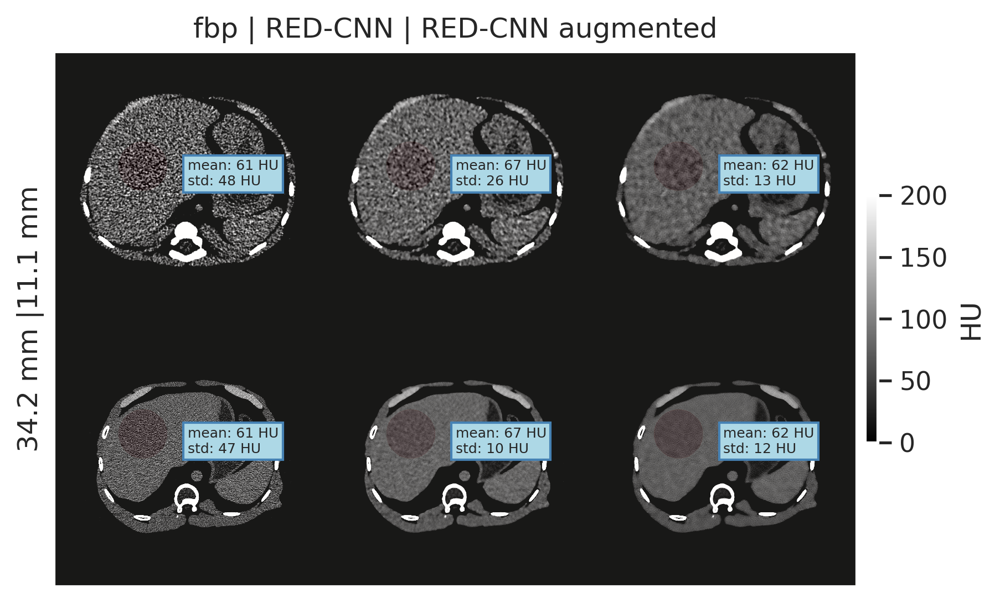

In [69]:
plt.figure(dpi=300)
make_montage(anthro_meta, diameters = [11.1, 34.2], phantom = 'anthropomorphic', roi_center=(220, 170), roi_diameter=0.2, wwwl=(200, 100))

<Axes: xlabel='effective diameter (cm)', ylabel='rmse reduction [%]'>

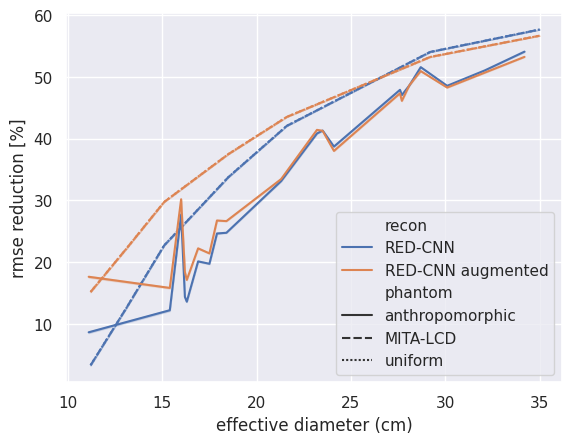

In [70]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter (cm)'] != 20) &
                          (results['recon'] != 'fbp')], x='effective diameter (cm)', y='rmse reduction [%]', style='phantom', hue='recon', hue_order=recons[1:]) 

This basically replicates Fig 7 from Nelson 2023, but now with the augmentation in place. Can also show in terms of noise reduction which might be more compelling too

In [71]:
import sys
import os
import torch
sys.path.append('../denoising')
from networks import RED_CNN

ModuleNotFoundError: No module named 'networks'

In [ ]:
def load_model(save_path, iter_=13000, multi_gpu=False):
    REDCNN = RED_CNN()
    f = os.path.join(save_path, 'REDCNN_{}iter.ckpt'.format(iter_))
    if multi_gpu:
        state_d = OrderedDict()
        for k, v in torch.load(f):
            n = k[7:]
            state_d[n] = v
        REDCNN.load_state_dict(state_d)
        return REDCNN
    else:
        REDCNN.load_state_dict(torch.load(f))
        return REDCNN

cnn_denoiser = load_model('../denoising/models/redcnn')
cnn_denoiser_augmented = load_model('../denoising/models/redcnn_augmented')

## Bonus: Noise Reduction in Adult Patient Images
From Held out low dose grand challenge dataset. Same clinical site and scanner as training set but different patients.

In [ ]:
import os
import sys
sys.path.append('../..')
import numpy as np
import torch
import matplotlib.pyplot as plt
from denoising.networks import RED_CNN
from collections import OrderedDict


def load_model(save_path, iter_=13000, multi_gpu=False):
    REDCNN = RED_CNN()
    f = os.path.join(save_path, 'REDCNN_{}iter.ckpt'.format(iter_))
    if multi_gpu:
        state_d = OrderedDict()
        for k, v in torch.load(f):
            n = k[7:]
            state_d[n] = v
        REDCNN.load_state_dict(state_d)
        return REDCNN
    else:
        REDCNN.load_state_dict(torch.load(f))
        return REDCNN

base_denoising_model  = load_model('../denoising/models/redcnn')
aug_denoising_model = load_model('../denoising/models/redcnn_augmented')

In [ ]:
def ctshow(img, window='soft_tissue'):
  # Define some specific window settings here
  if window == 'soft_tissue':
    ww = 400
    wl = 40
  elif window == 'bone':
    ww = 2500
    wl = 480
  elif window == 'lung':
    ww = 1500
    wl = -600
  else:
    ww = 6.0 * img.std()
    wl = img.mean()

  # Plot image on clean axes with specified window level
  vmin = wl - ww // 2
  vmax = wl + ww // 2
  plt.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
  plt.xticks([])
  plt.yticks([])

  return

In [ ]:
test_input = np.load('../data/Denoising_Data/test_input.npy').squeeze()
test_target = np.load('../data/Denoising_Data/test_target.npy').squeeze()

nexample = 2
base_CNNout = base_denoising_model.predict(test_input[:, None, ...], batch_size=1).squeeze()
aug_CNNout = aug_denoising_model.predict(test_input[:, None, ...], batch_size=1).squeeze()

In [ ]:
plt.figure(figsize=(16, 8), tight_layout=True)

plt.subplot(2, 2, 1)
plt.title('Low Dose Input', fontsize=16)
ctshow(test_input[3, 110:-110, 50:-50])

plt.subplot(2, 2, 2)
plt.title('Hi Dose Input', fontsize=16)
ctshow(test_target[3, 110:-110, 50:-50])

plt.subplot(2, 2, 3)
plt.title('Base Denoiser', fontsize=16)
ctshow(base_CNNout[3, 110:-110, 50:-50])

plt.subplot(2, 2, 4)
plt.title('Denoiser with Augmentation', fontsize=16)
ctshow(aug_CNNout[3, 110:-110, 50:-50])
plt.savefig(f'test_patient.png', dpi=600, bbox_inches='tight')

In [ ]:
import pydicom
from pathlib import Path
import matplotlib.pyplot as plt

ld_dir = Path('/gpfs_projects/brandon.nelson/Mayo_LDGC/images/L506/quarter_3mm/')
fd_dir = Path('/gpfs_projects/brandon.nelson/Mayo_LDGC/images/L506/full_3mm/')
adult_ld_dcm_files = sorted(list(ld_dir.glob('*.IMA')))
adult_fd_dcm_files = sorted(list(fd_dir.glob('*.IMA')))

In [ ]:
adult_ld_dcm_files[:5], adult_fd_dcm_files[:5]

In [ ]:
import SimpleITK as sitk
def load_img(dcm_file):
    if isinstance(dcm_file, sitk.Image): return sitk.GetArrayFromImage(dcm_file)
    dcm = pydicom.read_file(dcm_file)
    return dcm.pixel_array + float(dcm.RescaleIntercept)

In [ ]:
idx = 30
ld = load_img(adult_ld_dcm_files[idx])
rd = load_img(adult_fd_dcm_files[idx])
ctshow(ld)

In [ ]:
ctshow(adult_fd_dcm_files[idx])
ctshow(adult_ld_dcm_files[idx])

In [ ]:
denoised = cnn_denoiser.predict(ld).squeeze()

In [ ]:
ctshow(denoised)

In [ ]:
augmented = cnn_denoiser_augmented.predict(ld).squeeze()

In [ ]:
ctshow(augmented)

In [ ]:
import numpy as np
ctshow(np.concatenate([np.concatenate([ld, rd], axis=1),
                      np.concatenate([denoised, augmented], axis=1)], axis=0))

In [ ]:
ctshow(np.concatenate([ld-rd, ld-denoised, ld-augmented],axis=1), (200, 0), colorbar=False)

In [ ]:
ctshow(np.concatenate([rd - ld, rd-denoised, rd-augmented],axis=1), (200, 0), colorbar=False)

In [ ]:
rmses = {v: rmse(k, rd) for (k, v) in zip([ld, denoised, augmented], ['low dose', 'redcnn', 'redcnn-aug'])}
rmses

In [ ]:
adult_fd_images = np.array([load_img(o) for o in sorted(adult_fd_dcm_files)])
adult_ld_images = np.array([load_img(o) for o in sorted(adult_ld_dcm_files)])
adult_fd_images.shape, adult_ld_images.shape

In [ ]:
cnn_denoiser.to('cuda')
cnn_denoiser.predict(adult_ld_images[:,None,:,:], device='cuda', batch_size=32);

In [ ]:
rmse(adult_fd_images, adult_ld_images)

In [ ]:
batch_size=32
device = 'cuda'

series_rmse = ['low dose', 'redcnn', 'redcnn-aug']
res = np.zeros((len(series_rmse), len(adult_ld_dcm_files)))
adult_fd_images = np.array([load_img(o) for o in sorted(adult_fd_dcm_files)])
adult_ld_images = np.array([load_img(o) for o in sorted(adult_ld_dcm_files)])

for d_idx, (denoiser, name) in enumerate(zip([None, cnn_denoiser, cnn_denoiser_augmented], series_rmse)):
    if denoiser is None:
       res[0, :] = list(map(lambda x, y: rmse(x, y), adult_ld_images, adult_fd_images))
    else:
        denoiser.to(device)
        denoised = denoiser.predict(adult_ld_images[:, None,:,:], device=device, batch_size=batch_size).squeeze()
        res[d_idx, :] = list(map(lambda x, y: rmse(x, y), denoised, adult_fd_images))

In [ ]:
import pandas as pd

In [ ]:
rmse_df = pd.DataFrame(data=res.T, columns = series_rmse)
rmse_df['full dose file'] = str(adult_fd_dcm_files)
rmse_df['quarter dose file'] = str(adult_ld_dcm_files)
rmse_df

In [ ]:
import seaborn as sns

In [ ]:
sns.violinplot(data=rmse_df)
plt.ylabel('RMSE')

In [ ]:
sns.scatterplot(data=rmse_df,x='low dose', y='redcnn', label='redcnn')
sns.scatterplot(data=rmse_df,x='low dose', y='redcnn-aug', label='redcnn aug')
plt.legend()

The fact that the augmented model underperforms the original model when tested on *adult* data is unsurprising, our hypothesis is that it would act as a regularizer and yield more consistent performance in *smaller* patients, need to explore this next

### [Mayo Clinic Low-dose CT image and projection dataset](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.14594)

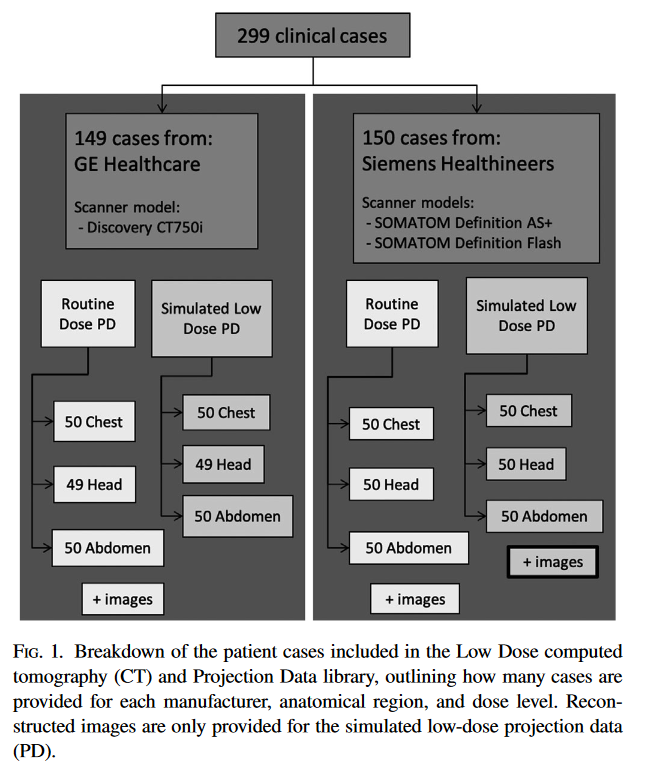

In [ ]:
ls /gpfs_projects/common_data/DLIR/TCIA/manifest-1643214718297/

In [ ]:
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
import pydicom
ldct_dir = Path('/gpfs_projects/common_data/DLIR/TCIA/manifest-1643214718297')
meta = pd.read_csv(ldct_dir/'metadata.csv', index_col=0)
meta.head()

In [ ]:
patients = meta['Subject ID'].unique()
len(patients)

In [ ]:
subject_id = patients[0]
dose = 'Full' # 'Full' or 'Low'
assert(dose in ['Full', 'Low'])
n_images = meta[(meta['Subject ID']==subject_id) & (meta['Series Description']==f'{dose} Dose Images')]['Number of Images'].item()
image_dcms = sorted(list(Path(ldct_dir / meta[(meta['Subject ID']==subject_id) & (meta['Series Description']==f'{dose} Dose Images')]['File Location'].item().strip('./')).glob('*')))
assert(len(image_dcms) == n_images)

In [ ]:
def load_img(dcm_file):
    dcm = pydicom.read_file(dcm_file)
    return dcm.pixel_array + float(dcm.RescaleIntercept)

def ctshow(img, wwwl=(400, 50), colorbar=True, show=True):
    if isinstance(img, str | Path): img = load_img(img)
    ww, wl = wwwl
    vmin = wl - ww/2
    vmax = wl + ww/2
    f, ax = plt.subplots(dpi=300)
    im = ax.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
    if colorbar: plt.colorbar(im, ax=ax)
    plt.axis('off')
    if show: plt.show()

In [ ]:
ctshow(load_img(image_dcms[2]))

**Need to think about what this notebook adds and if its different from `patient images.ipynb`, the main message is denoising efficiency and thus belongs in that notebook**

## Conclusions

This can have the merged uniform and anthro rmse reduction plot like in Nelson et al 2023